In [1]:
import cptac
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
import pcprutils as ut
from statannot import add_stat_annotation
import numpy as np
import cptac.pancan as pc

In [2]:
cancer = 'LUAD'
luad = pc.PancanLuad()

/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/gtfparse/read_gtf.py:82: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  chunk_iterator = pd.read_csv(
/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/gtfparse/read_gtf.py:82: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  chunk_iterator = pd.read_csv(


/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/cptac/pancan/washuluad.py:136: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_df = tumor.append(normal)
/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/cptac/pancan/washuluad.py:136: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_df = tumor.append(normal)
/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/cptac/pancan/washuluad.py:136: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_df = tumor.append(normal)


/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/gtfparse/read_gtf.py:82: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  chunk_iterator = pd.read_csv(
/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/gtfparse/read_gtf.py:82: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  chunk_iterator = pd.read_csv(


/Users/humbertogiraldez/opt/anaconda3/lib/python3.9/site-packages/cptac/pancan/washuluad.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rna_combined = rna_tumor.append(rna_normal)


In [3]:
df = ut.get_prot_trans_df(luad)
df.Tissue = [tissue.title() for tissue in df.Tissue]
df = df.rename(columns = {'Proteomics': 'Protein Abundance', 'Transcriptomics': 'RNA Abundance'})

In [4]:
dGenes = pd.read_csv('/Users/humbertogiraldez/Downloads/IntOGen-DriverGenes.tsv', delimiter='\t')
dGenes = list(dGenes.Symbol)


In [5]:
def IntersecOfSets(arr1, arr2, arr3):
    # Converting the arrays into sets
    s1 = set(arr1)
    s2 = set(arr2)
    s3 = set(arr3)
      
    # Calculates intersection of 
    # sets on s1 and s2
    set1 = s1.intersection(s2)         #[80, 20, 100]
      
    # Calculates intersection of sets
    # on set1 and s3
    result_set = set1.intersection(s3)
      
    # Converts resulting set to list
    final_list = list(result_set)
    return final_list


In [47]:
diff_prot = pd.read_csv('data/Proteomics_differential_expression_df.csv')
diff_prot = diff_prot[diff_prot.Cancer == cancer]
diff_trans = pd.read_csv('data/Transcriptomics_differential_expression_df.csv')
diff_trans = diff_trans[diff_trans.Cancer == cancer]
delta_corr = pd.read_csv('data/delta_correlation_df_with_significance.csv')
delta_corr = delta_corr[delta_corr.Cancer == cancer]

prot_genes = diff_prot.Gene
trans_genes = diff_trans.Gene
delta_genes = delta_corr.Gene

common_genes = IntersecOfSets(prot_genes,trans_genes,delta_genes)

genes_all_sig = []
genes_prot_trans_sig = []
genes_delta_sig = []
for gene in common_genes:
    tmpList = []
    prot_val = diff_prot[diff_prot.Gene == gene].FDR[diff_prot[diff_prot.Gene == gene].index[0]]
    trans_val = diff_trans[diff_trans.Gene == gene].FDR[diff_trans[diff_trans.Gene == gene].index[0]]                                                   
    delta_val = delta_corr[delta_corr.Gene == gene].FDR[delta_corr[delta_corr.Gene == gene].index[0]]

    if(prot_val < 0.05 and trans_val < 0.05 and delta_val < 0.05):
        genes_all_sig.append(gene)

    if(prot_val < 0.05 and trans_val < 0.05 and delta_val > 0.05):
        genes_prot_trans_sig.append(gene)

    if(prot_val > 0.05 and trans_val > 0.05 and delta_val < 0.05):
        genes_delta_sig.append(gene)


In [7]:
def plot_helper(gene):
    gene_df = df[df.Gene == gene]
    trans_pval = diff_trans[diff_trans.Gene == gene].FDR
    trans_pval = np.array(trans_pval)
    prot_pval = diff_prot[diff_prot.Gene == gene].FDR
    prot_pval = np.array(prot_pval)

    sns.regplot(data = gene_df[gene_df.Tissue == 'Normal'], y = 'Protein Abundance', x = 'RNA Abundance')
    sns.regplot(data = gene_df[gene_df.Tissue == 'Tumor'], y = 'Protein Abundance', x = 'RNA Abundance').set(title=gene)
    
    plt.show()

    g = sns.boxplot(data = gene_df, x = 'Tissue', y = 'Protein Abundance', order = ['Normal', 'Tumor'], fliersize = 0)
    test_results = add_stat_annotation(g, data=df, x='Tissue', y='Protein Abundance', order = ['Normal', 'Tumor'],
                                   box_pairs=[('Normal', 'Tumor')],
                                   pvalues = prot_pval, text_format='star',
                                   loc='outside', perform_stat_test=False, verbose = False)
    plt.show()
    g2 = sns.boxplot(data = gene_df, x = 'Tissue', y = 'RNA Abundance', order = ['Normal', 'Tumor'], fliersize = 0)
    test_results = add_stat_annotation(g2, data=df, x='Tissue', y='RNA Abundance', order = ['Normal', 'Tumor'],
                                   box_pairs=[('Normal', 'Tumor')],
                                   pvalues = trans_pval, text_format='star',
                                   loc='outside', perform_stat_test=False, verbose = False)
    plt.show()

In [48]:
def plot_valid(delta_sig=False, prot_dif_sig=False, rna_dif_sig=False, cancer='LUAD', dGenes = []):
    if(len(dGenes) > 0):
        all_sig_driver = list(set(genes_all_sig) & set(dGenes))
        prot_trans_sig_driver = list(set(genes_prot_trans_sig) & set(dGenes))
        delta_sig_driver = list(set(genes_delta_sig) & set(dGenes))
        
        if(delta_sig == True and prot_dif_sig == True and rna_dif_sig == True):
            for gene in all_sig_driver:
                plot_helper(gene)

        elif(delta_sig == False and prot_dif_sig == True and rna_dif_sig == True):
            for gene in prot_trans_sig_driver:

                plot_helper(gene)
        elif(delta_sig == True and prot_dif_sig == False and rna_dif_sig == False):
            for gene in delta_sig_driver:

                plot_helper(gene)
    else:
        
        if(delta_sig == True and prot_dif_sig == True and rna_dif_sig == True):
            for gene in genes_all_sig:
                plot_helper(gene)
        elif(delta_sig == False and prot_dif_sig == True and rna_dif_sig == True):
            for gene in genes_prot_trans_sig:
                plot_helper(gene)
        elif(delta_sig == True and prot_dif_sig == False and rna_dif_sig == False):
            for gene in genes_delta_sig:
                
                plot_helper(gene)

        

In [13]:
# plot_valid(delta_sig=True, prot_dif_sig=True, rna_dif_sig=True, cancer='LUAD')

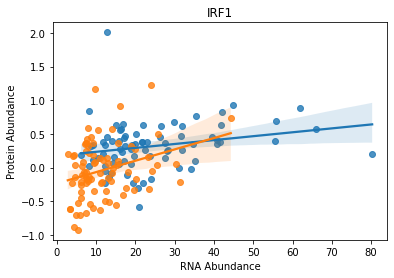

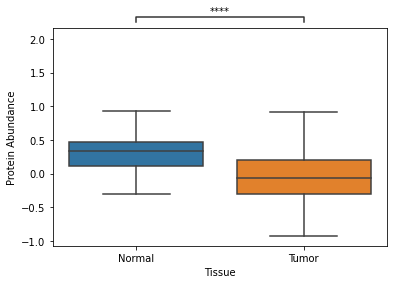

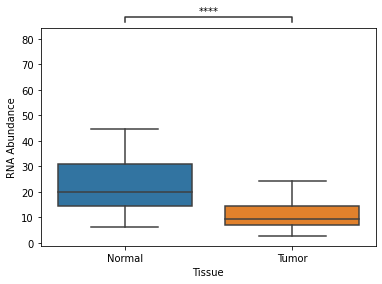

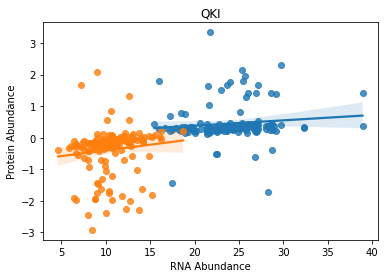

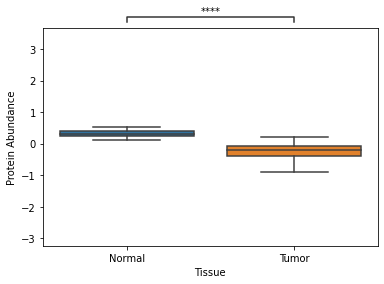

...

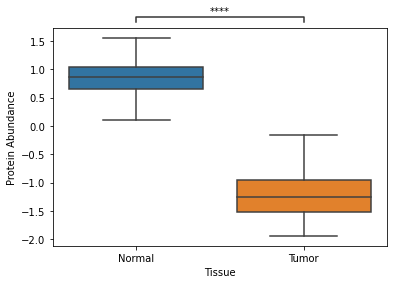

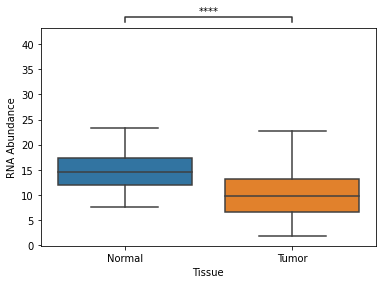

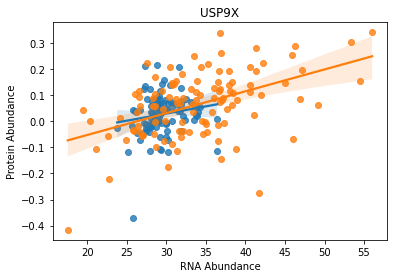

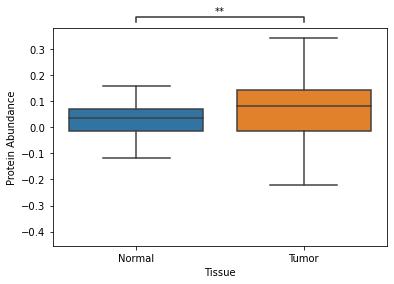

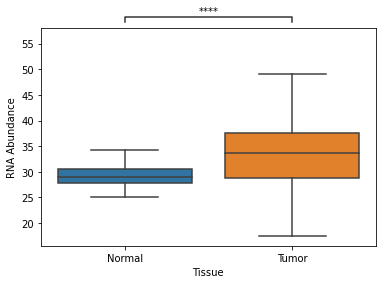

In [50]:
plot_valid(delta_sig=False, prot_dif_sig=True, rna_dif_sig=True, cancer='LUAD', dGenes= dGenes)

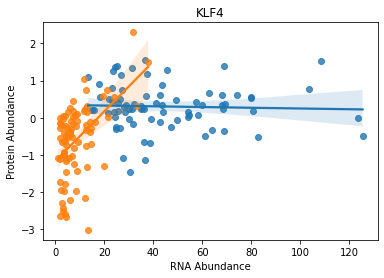

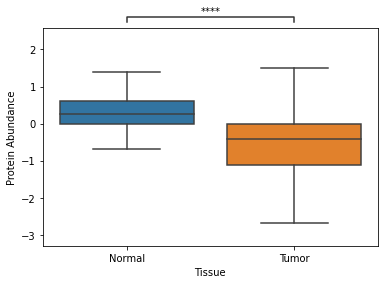

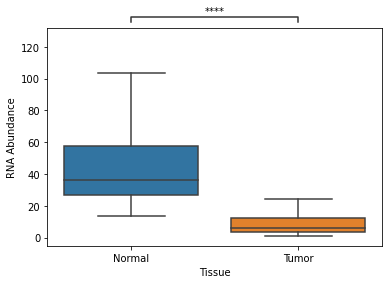

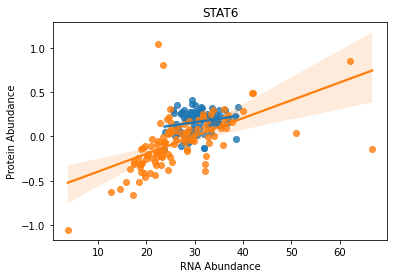

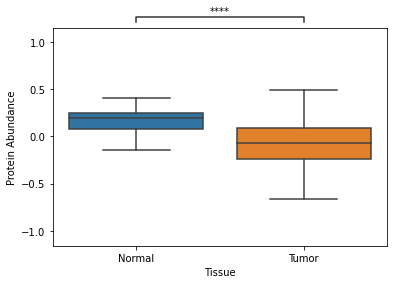

...

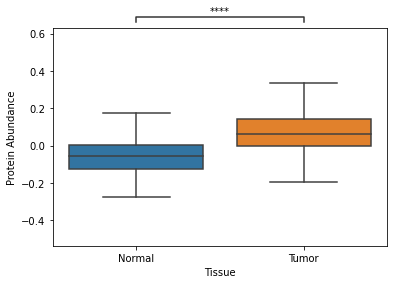

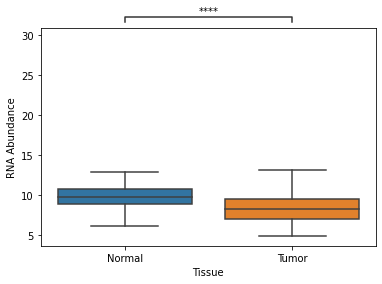

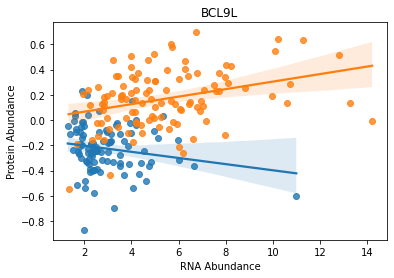

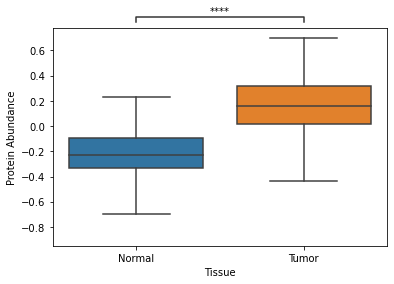

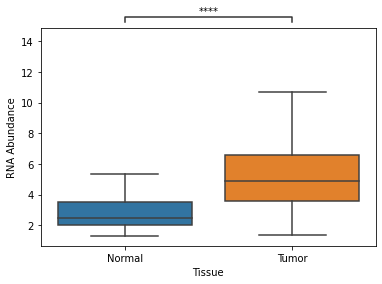

In [51]:
plot_valid(delta_sig=True, prot_dif_sig=True, rna_dif_sig=True, cancer='LUAD', dGenes= dGenes)

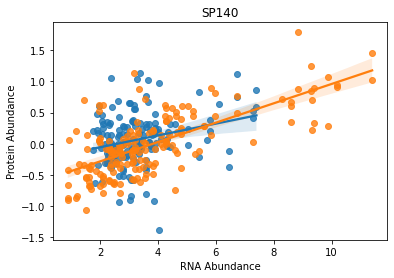

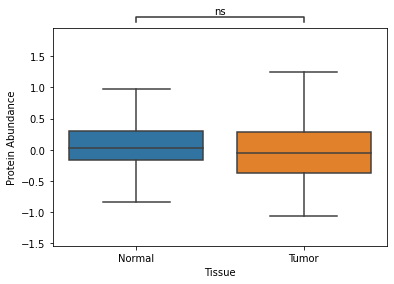

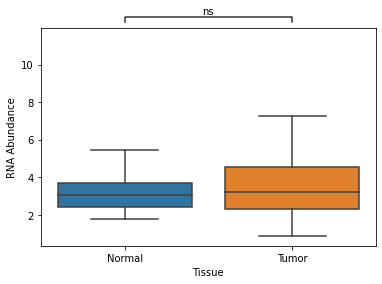

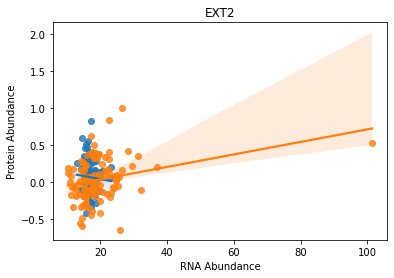

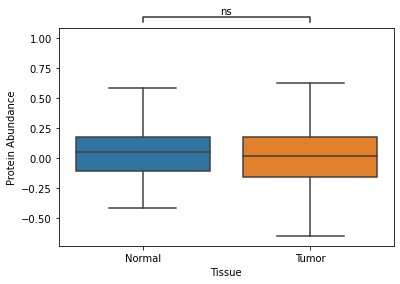

...

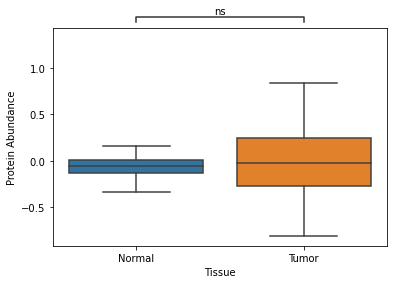

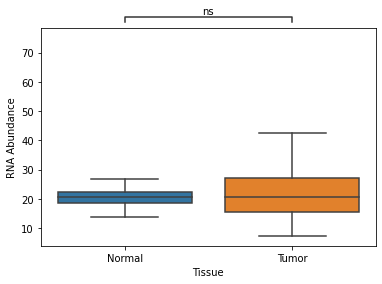

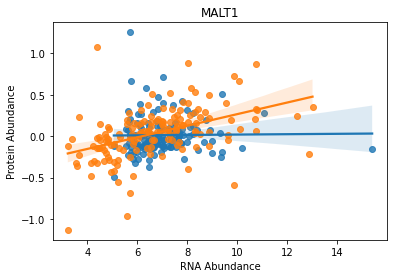

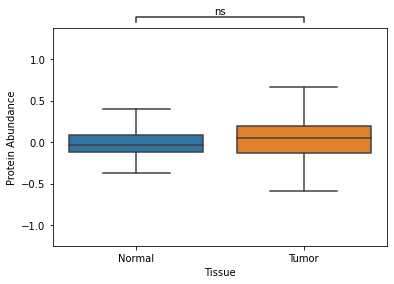

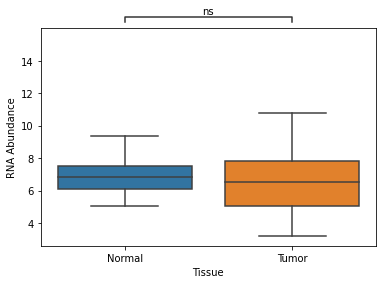

In [52]:
plot_valid(delta_sig=True, prot_dif_sig=False, rna_dif_sig=False, cancer='LUAD', dGenes= dGenes)

In [62]:
gene = 'DAXX'
prot_val = diff_prot[diff_prot.Gene == gene].FDR[diff_prot[diff_prot.Gene == gene].index[0]]
trans_val = diff_trans[diff_trans.Gene == gene].FDR[diff_trans[diff_trans.Gene == gene].index[0]]                                                   
delta_val = delta_corr[delta_corr.Gene == gene]#.FDR[delta_corr[delta_corr.Gene == gene].index[0]]

In [63]:
delta_val

,Gene,Delta_Correlation,P_Value,FDR,Cancer,Significant
33243,DAXX,0.32866,0.002076,0.005295,LUAD,True


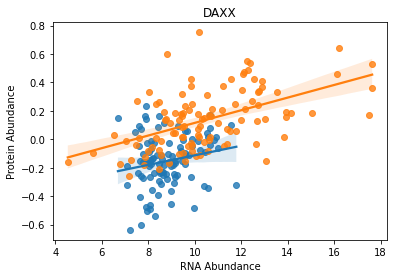

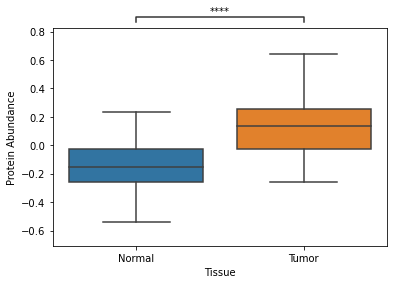

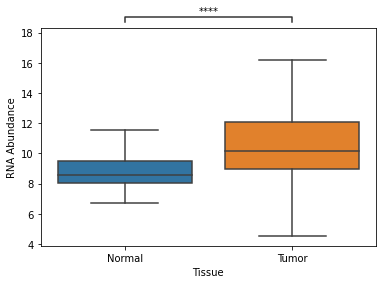

In [56]:
plot_helper('DAXX')